In [210]:
# Monitorization
import comet_ml
from comet_ml import start

import os

# Data
import numpy as np
import pandas as pd

# Audio
import librosa
import librosa.display

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Machine Learning
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, LearningRateScheduler, CSVLogger, ReduceLROnPlateau
from sklearn.utils import shuffle

# Deep Learning Visualization
from sklearn.metrics import confusion_matrix

# Configurar el estilo de los gráficos
sns.set(style="ticks")

# Undestanding the Dataset
We have downloaded the Dataset Best of Watkins Marine Mammals from kaggle. It contains 37 classes, each of them with .wav files that contains sounds of each of the classes.

## Load Data

In [211]:
# !ls ../../Dataset/Audios/Watkins\ Marine\ Mammals

In [212]:
# # Main Folder with all classes and files
# main_folder = '../../Dataset/Audios/Watkins Marine Mammals/'

# # Folder contains subfolders = classes and in them, the audio sample
# classes = os.listdir(main_folder)

# # delete README.MD
# classes.remove('README.MD')

# # Create an empty list to store the audio file paths
# audio_files = []

# # Loop through all the subfolders and files
# for subfolder in classes:
#     # Get the list of all files in the subfolder
#     files = os.listdir(main_folder + subfolder)
#     # Loop through all the files
#     for f in files:
#         # Get the full path of the file
#         audio_files.append(main_folder + subfolder + '/' + f)

In [213]:
# df = pd.DataFrame(audio_files, columns=['File'])

# # Add class
# df['Class'] = df['File'].apply(lambda x: x.split('/')[-2])

In [214]:
# # Number of files per class and duration of each file
# for f in audio_files:
#     # Load the audio file
#     x, sr = librosa.load(f)
#     # Duration of the audio file
#     duration = librosa.get_duration(y=x, sr=sr)
#     # Add the duration to the duration list
#     df.loc[df['File'] == f, 'Duration'] = duration


# # Create an empty list to store the audio file paths
# audio_files = []


In [215]:
# # Save as CSV
# df.to_csv('../../Dataset/CSVs/WatkinsMarineMammals.csv', index=False)

Data was loaded from the folders and it was made a dataframe that has been saved as a csv so it can directly be loaded from the CSV which contains each file path, the class and the duration of the segment. We will load the CSV directly:

In [216]:
# Load CSV
df = pd.read_csv('../../Dataset/CSVs/WatkinsMarineMammals.csv')
df

,File,Class,Duration
0,../../Dataset/Audios/Watkins Marine Mammals/White_sidedDolphin/7900501C.wav,White_sidedDolphin,2.521905
1,../../Dataset/Audios/Watkins Marine Mammals/White_sidedDolphin/7500103L.wav,White_sidedDolphin,2.069887
2,../../Dataset/Audios/Watkins Marine Mammals/White_sidedDolphin/7500103K.wav,White_sidedDolphin,2.215329
3,../../Dataset/Audios/Watkins Marine Mammals/White_sidedDolphin/7900600X.wav,White_sidedDolphin,2.742222
4,../../Dataset/Audios/Watkins Marine Mammals/White_sidedDolphin/7800701F.wav,White_sidedDolphin,1.437052
...,...,...,...
15527,../../Dataset/Audios/Watkins Marine Mammals/RingedSeal/6800500K.wav,RingedSeal,0.458639
15528,../../Dataset/Audios/Watkins Marine Mammals/RingedSeal/68040006.wav,RingedSeal,0.334014
15529,../../Dataset/Audios/Watkins Marine Mammals/RingedSeal/6800300C.wav,RingedSeal,1.418005
15530,../../Dataset/Audios/Watkins Marine Mammals/RingedSeal/68005004.wav,RingedSeal,0.773469


Let's check classes distribution:

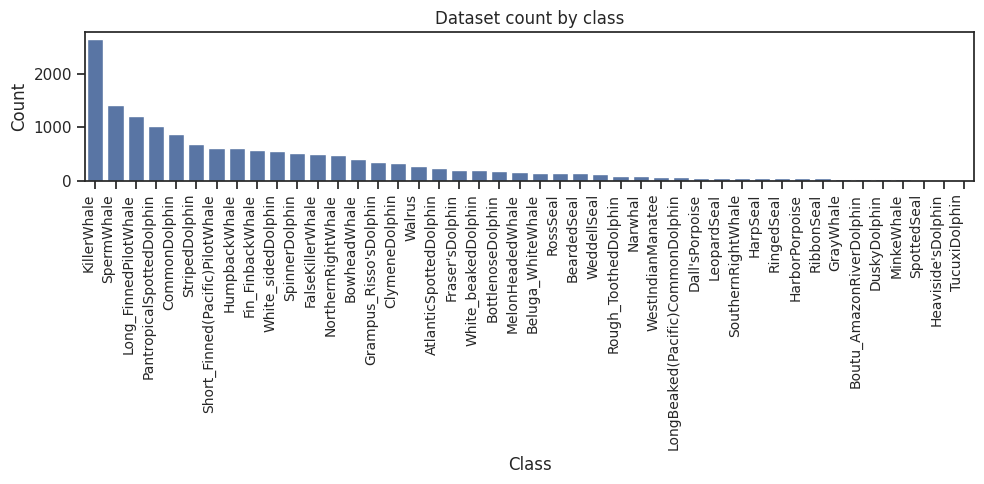

In [217]:
# Bar plot of dataset count sorted by count
plt.figure(figsize=(10, 5))
sorted_df = df['Class'].value_counts().reset_index()
sorted_df.columns = ['Class', 'Count']
sns.barplot(data=sorted_df, x='Class', y='Count', order=sorted_df['Class'])
plt.title('Dataset count by class')
plt.xticks(rotation=90, ha='right', fontsize=10)  # Adjust fontsize and alignment
plt.tight_layout()  # Adjust layout to make room for labels
plt.show()

In [218]:
# # show alphabetically by class name
# sorted_df.sort_values(by='Class')

In [219]:
# # 10 classes with the less files
# df['Class'].value_counts().tail(15)

We will remove those classes that have less than 10 samples:

In [220]:
# # delete classes with less than 10 files
# df = df[df['Class'] != 'GraySeal']
# df = df[df['Class'] != 'StellerSeaLion']
# df = df[df['Class'] != 'IrawaddyDolphin']
# df = df[df['Class'] != 'BlueWhale']
# df = df[df['Class'] != 'SeaOtter']
# df = df[df['Class'] != 'FinlessPorpoise']
# df = df[df['Class'] != 'NewZealandFurSeal']
# df = df[df['Class'] != 'HoodedSeal']
# df = df[df['Class'] != 'Commerson\'sDolphin']
# df = df[df['Class'] != 'HarbourSeal']

# # Also delete folders from directory
# !rm -r '../../Dataset/Audios/Watkins Marine Mammals/GraySeal'
# !rm -r '../../Dataset/Audios/Watkins Marine Mammals/StellerSeaLion'
# !rm -r '../../Dataset/Audios/Watkins Marine Mammals/IrawaddyDolphin'
# !rm -r '../../Dataset/Audios/Watkins Marine Mammals/BlueWhale'
# !rm -r '../../Dataset/Audios/Watkins Marine Mammals/SeaOtter'
# !rm -r '../../Dataset/Audios/Watkins Marine Mammals/FinlessPorpoise'
# !rm -r '../../Dataset/Audios/Watkins Marine Mammals/NewZealandFurSeal'
# !rm -r '../../Dataset/Audios/Watkins Marine Mammals/HoodedSeal'
# # !rm -r '../../Dataset/Audios/Watkins Marine Mammals/Commerson'sDolphin'
# !rm -r '../../Dataset/Audios/Watkins Marine Mammals/HarbourSeal'

In [221]:
# Long_FinnedPilotWhale, StripedDolphin, SpermWhale, KillerWhale, HumpbackWhale, CommonDolphin, BottlenoseDolphin, MinkeWhale, Fin_FinbackWhale are important_species
important_species = ['Long_FinnedPilotWhale', 'StripedDolphin', 'SpermWhale', 'KillerWhale', 'HumpbackWhale', 'CommonDolphin', 'BottlenoseDolphin', 'MinkeWhale', 'Fin_FinbackWhale']

In green we highlight the classes present in the Strait of Gibraltar.

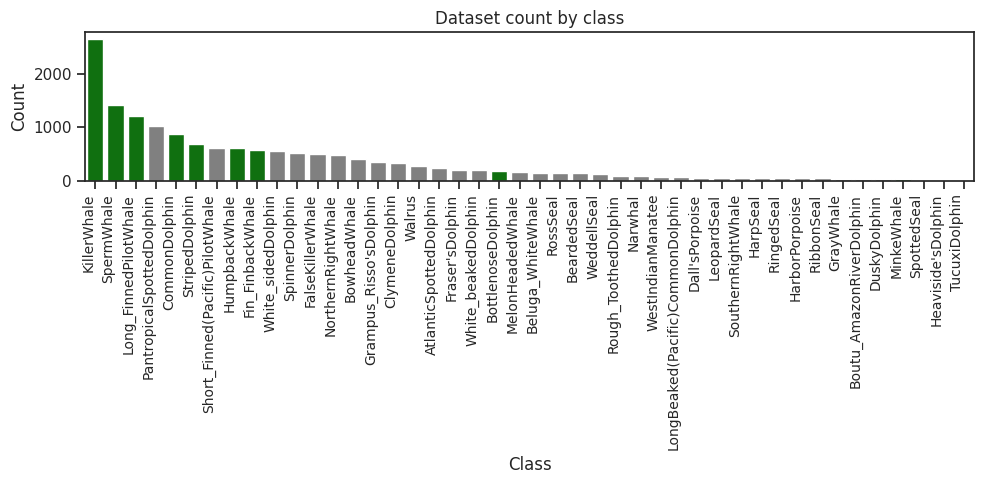

In [222]:
sorted_df = df['Class'].value_counts().reset_index()
sorted_df.columns = ['Class', 'Count']

# Create a new column to indicate if the species is important
sorted_df['Important'] = sorted_df['Class'].apply(lambda x: 'Important' if x in important_species else 'Not Important')

# Bar plot of dataset count with colors for important species
plt.figure(figsize=(10, 5))
sns.barplot(data=sorted_df, x='Class', y='Count', hue='Important', palette={'Important': 'green', 'Not Important': 'gray'})
plt.title('Dataset count by class')
plt.xticks(rotation=90, ha='right', fontsize=10)
plt.tight_layout()
plt.legend([],[], frameon=False)
plt.show()

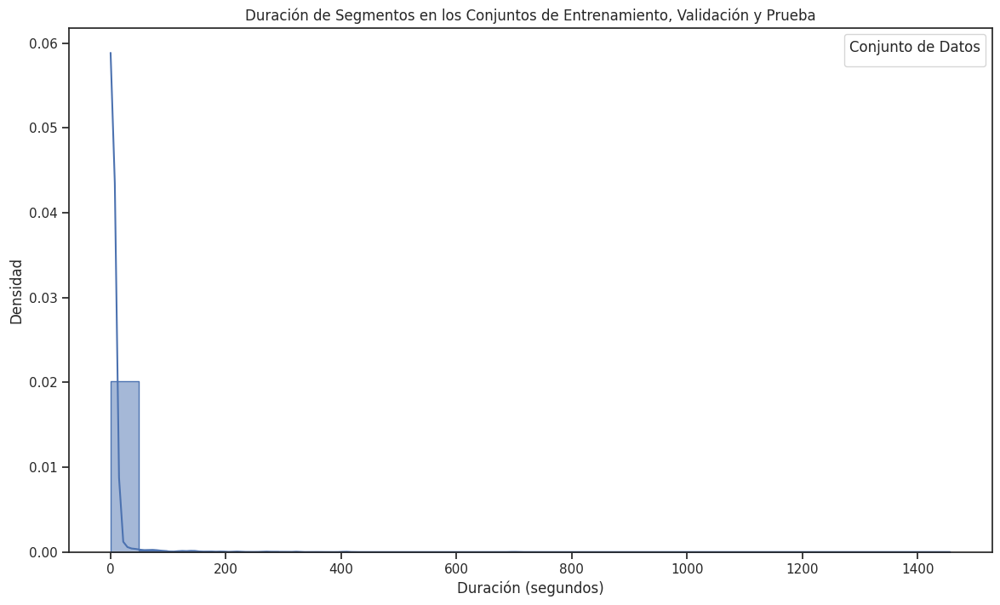

In [223]:
# Crear el gráfico de duración de audios
plt.figure(figsize=(14, 8))
sns.histplot(data=df, x='Duration', element='step', stat='density', common_norm=False, bins=30, kde=True)
plt.title('Duración de Segmentos en los Conjuntos de Entrenamiento, Validación y Prueba')
plt.xlabel('Duración (segundos)')
plt.ylabel('Densidad')
plt.legend(title='Conjunto de Datos')
plt.show()

In [224]:
# prijt number of audios with more than 3 seconds duration, 3 seconds duration and less than 3 seconds duration
print(f"Number of audios with less than 3 seconds duration: {len(df[df['Duration'] < 3])}")
print(f"Number of audios with 3 seconds duration: {len(df[df['Duration'] == 3])}")
print(f"Number of audios with more than 3 seconds duration: {len(df[df['Duration'] > 3])}")

Number of audios with less than 3 seconds duration: 11698
Number of audios with 3 seconds duration: 14
Number of audios with more than 3 seconds duration: 3820


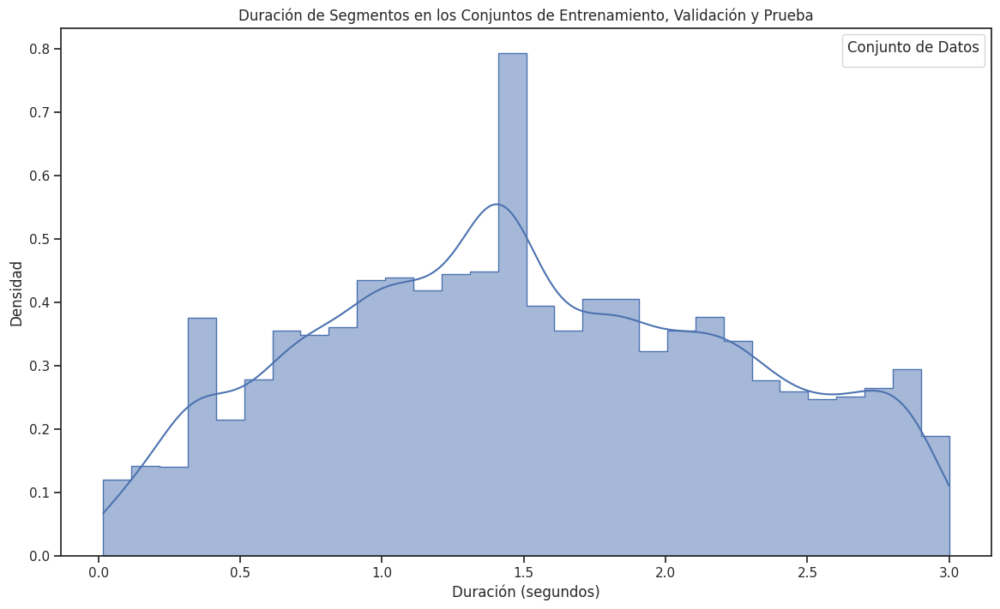

In [225]:
plt.figure(figsize=(14, 8))
sns.histplot(data=df[df['Duration'] < 3], x='Duration', element='step', stat='density', common_norm=False, bins=30, kde=True)
plt.title('Duración de Segmentos en los Conjuntos de Entrenamiento, Validación y Prueba')
plt.xlabel('Duración (segundos)')
plt.ylabel('Densidad')
plt.legend(title='Conjunto de Datos')
plt.show()

In [226]:
# dont limitate length of column in print
pd.set_option('display.max_colwidth', None)
# top 10 files with the most duration
df.sort_values(by='Duration', ascending=False).head(10)

,File,Class,Duration
10578,../../Dataset/Audios/Watkins Marine Mammals/SpermWhale/9004600V.wav,SpermWhale,1455.931701
10153,../../Dataset/Audios/Watkins Marine Mammals/SpermWhale/8401600B.wav,SpermWhale,1260.000000
3829,../../Dataset/Audios/Watkins Marine Mammals/Short_Finned(Pacific)PilotWhale/8401600B.wav,Short_Finned(Pacific)PilotWhale,1260.000000
10152,../../Dataset/Audios/Watkins Marine Mammals/SpermWhale/9400500C.wav,SpermWhale,1220.100680
10739,../../Dataset/Audios/Watkins Marine Mammals/SpermWhale/9500100Q.wav,SpermWhale,1179.215374
9786,../../Dataset/Audios/Watkins Marine Mammals/SpermWhale/7200900P.wav,SpermWhale,1162.098322
14506,../../Dataset/Audios/Watkins Marine Mammals/Fin_FinbackWhale/78014002.wav,Fin_FinbackWhale,1104.000000
14540,../../Dataset/Audios/Watkins Marine Mammals/Fin_FinbackWhale/78014001.wav,Fin_FinbackWhale,1104.000000
8132,../../Dataset/Audios/Watkins Marine Mammals/HumpbackWhale/6301901L.wav,HumpbackWhale,709.056780
9950,../../Dataset/Audios/Watkins Marine Mammals/SpermWhale/90011001.wav,SpermWhale,698.684036


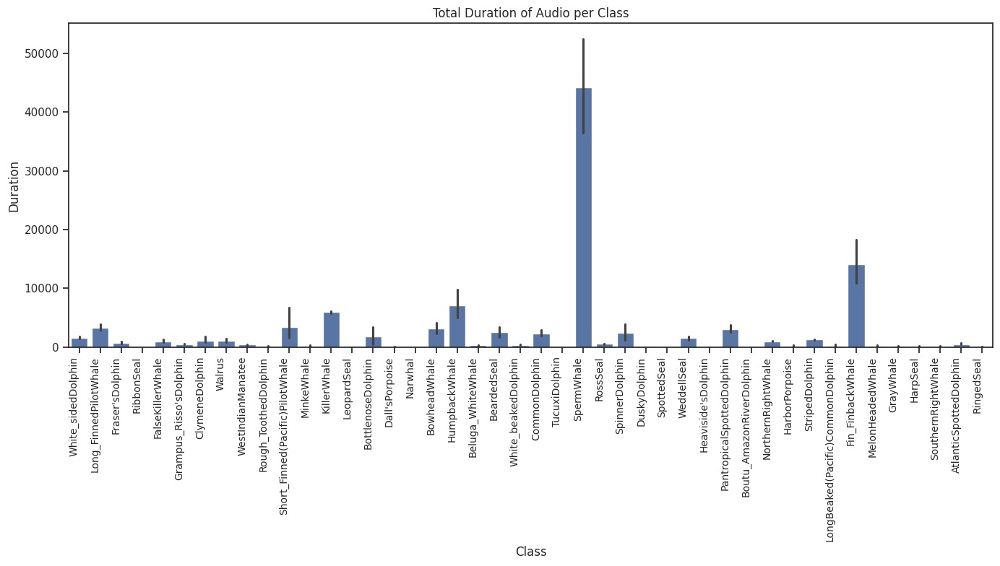

In [227]:
# Plot total duration of audio per class
plt.figure(figsize=(14, 8))
sns.barplot(data=df, x='Class', y='Duration', estimator=sum)
plt.title('Total Duration of Audio per Class')
plt.xticks(rotation=90, ha='right', fontsize=10)  # Adjust fontsize and alignment
plt.tight_layout()  # Adjust layout to make room for labels
plt.show()

### Split Dataset

Create train, validation and test datasets in 80%, 10% and 10% respectively.
Also create classes dictionary to map the classes to integers, alphabetically sorted.

In [228]:
# Split the dataset into training, validation and test sets
df_train, df_val = train_test_split(df, test_size=0.2, random_state=42, stratify=df['Class'])
df_val, df_test = train_test_split(df_val, test_size=0.5, random_state=42, stratify=df_val['Class'])

In [229]:
# Create classes mapping alphabetically
classes = df['Class'].unique()
classes.sort()
classes_mapping = {classes[i]: i for i in range(len(classes))}
# Reverse the classes_mapping dictionary
reverse_classes_mapping = {v: k for k, v in classes_mapping.items()}
classes_mapping

{'AtlanticSpottedDolphin': 0,
 'BeardedSeal': 1,
 'Beluga_WhiteWhale': 2,
 'BottlenoseDolphin': 3,
 'Boutu_AmazonRiverDolphin': 4,
 'BowheadWhale': 5,
 'ClymeneDolphin': 6,
 'CommonDolphin': 7,
 "Dall'sPorpoise": 8,
 'DuskyDolphin': 9,
 'FalseKillerWhale': 10,
 'Fin_FinbackWhale': 11,
 "Fraser'sDolphin": 12,
 "Grampus_Risso'sDolphin": 13,
 'GrayWhale': 14,
 'HarborPorpoise': 15,
 'HarpSeal': 16,
 "Heaviside'sDolphin": 17,
 'HumpbackWhale': 18,
 'KillerWhale': 19,
 'LeopardSeal': 20,
 'LongBeaked(Pacific)CommonDolphin': 21,
 'Long_FinnedPilotWhale': 22,
 'MelonHeadedWhale': 23,
 'MinkeWhale': 24,
 'Narwhal': 25,
 'NorthernRightWhale': 26,
 'PantropicalSpottedDolphin': 27,
 'RibbonSeal': 28,
 'RingedSeal': 29,
 'RossSeal': 30,
 'Rough_ToothedDolphin': 31,
 'Short_Finned(Pacific)PilotWhale': 32,
 'SouthernRightWhale': 33,
 'SpermWhale': 34,
 'SpinnerDolphin': 35,
 'SpottedSeal': 36,
 'StripedDolphin': 37,
 'TucuxiDolphin': 38,
 'Walrus': 39,
 'WeddellSeal': 40,
 'WestIndianManatee': 41,
 

Important, randomize the data before training the model

In [230]:
df_train = df_train.sample(frac=1).reset_index(drop=True)
df_val = df_val.sample(frac=1).reset_index(drop=True)
df_test = df_test.sample(frac=1).reset_index(drop=True)

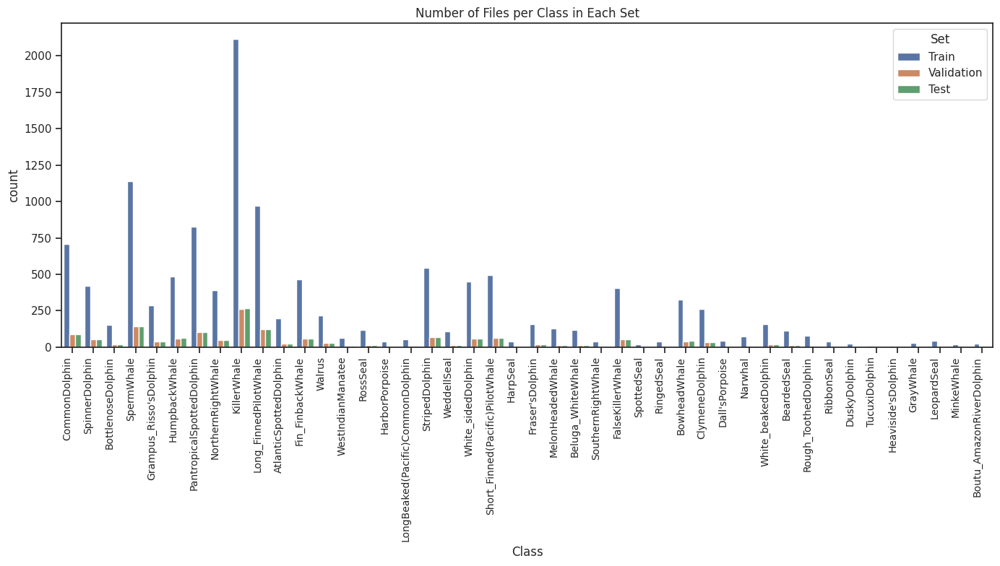

In [231]:
# Combine the datasets with an additional column indicating the set
df_train['Set'] = 'Train'
df_val['Set'] = 'Validation'
df_test['Set'] = 'Test'

# Concatenate all dataframes
df_combined = pd.concat([df_train, df_val, df_test])

# Plot number of files per class in each set not stacked
plt.figure(figsize=(14, 8))
sns.countplot(data=df_combined, x='Class', hue='Set')
plt.title('Number of Files per Class in Each Set')
plt.xticks(rotation=90, ha='right', fontsize=10)  # Adjust fontsize and alignment
plt.legend(title='Set')
plt.tight_layout()  # Adjust layout to make room for labels
plt.show()

In [232]:
# check if there are files of all classes in each set
print('Classes in Train set:', df_train['Class'].nunique())
print('Classes in Validation set:', df_val['Class'].nunique())
print('Classes in Test set:', df_test['Class'].nunique())

# check not common classes between sets
train_classes = set(df_train['Class'].unique())
val_classes = set(df_val['Class'].unique())
test_classes = set(df_test['Class'].unique())

# Classes in Train set but not in Validation set
print('Classes in Train set but not in Validation set:', train_classes - val_classes)
print('Classes in Train set but not in Test set:', train_classes - test_classes)
print('Classes in Validation set but not in Train set:', val_classes - train_classes)

Classes in Train set: 44
Classes in Validation set: 44
Classes in Test set: 44
Classes in Train set but not in Validation set: set()
Classes in Train set but not in Test set: set()
Classes in Validation set but not in Train set: set()


# Functions

In [233]:
def plot_results(df_results, reverse_classes_mapping=reverse_classes_mapping, mode='random', classes=None):
    # If classes, select only specific classes
    if classes:
        df_results = df_results[df_results['PredictedClass'].isin(classes)]

    # Highest confidence
    if mode == 'max':
        # Select the 25 samples with the highest confidence
        samples = df_results.sort_values(by='Confidence', ascending=False).head(25)
    # Lowest confidence
    elif mode == 'min':
        # Select the 25 samples with the lowest confidence
        samples = df_results.sort_values(by='Confidence').head(25)
    # Random
    else: # mode == 'random':
        # Select 25 random samples
        samples = df_results.sample(25, random_state=42)

    # Create a grid of plots
    fig, axes = plt.subplots(5, 5, figsize=(20, 20))

    # Flatten the axes
    axes = axes.ravel()

    # Loop through all the samples
    for i, (_, row) in enumerate(samples.iterrows()):
        # Get the true and predicted labels
        true_label = reverse_classes_mapping[row['True']]
        pred_label = reverse_classes_mapping[row['Predicted']]
        confidence = row['Confidence']
        
        # Get the color of the label
        color = 'green' if true_label == pred_label else 'red'
        
        # Calculate the mel spectrogram
        mel_spectrogram = librosa.feature.melspectrogram(y=row['Signal'], sr=48000)
        mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)
        
        # Plot the mel spectrogram
        axes[i].imshow(mel_spectrogram, origin='lower')
        axes[i].set_title(f"True: {true_label}\nPred: {pred_label} ({confidence:.2f})", color=color)
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# Preprocess Audios

As most audios are 3 seconds more or less, the time windows that will be used will be 3 seconds

Sampling rate was 256000 but BirdNET takes 48000, so 48000 will be used. It just changes the resolution of the audio.

Class: CommonDolphin


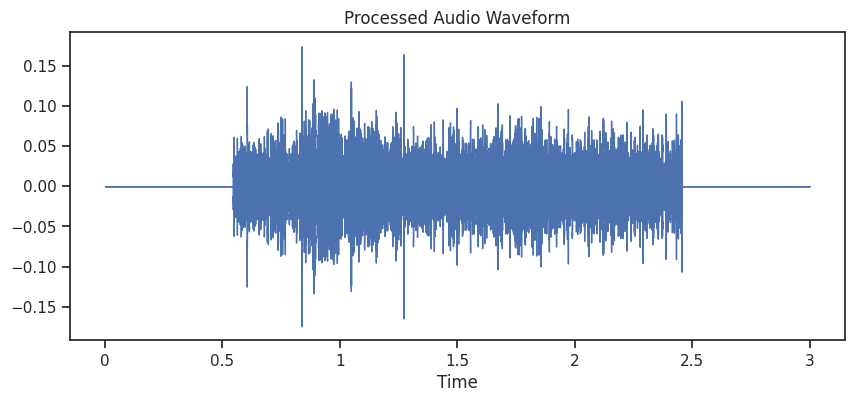

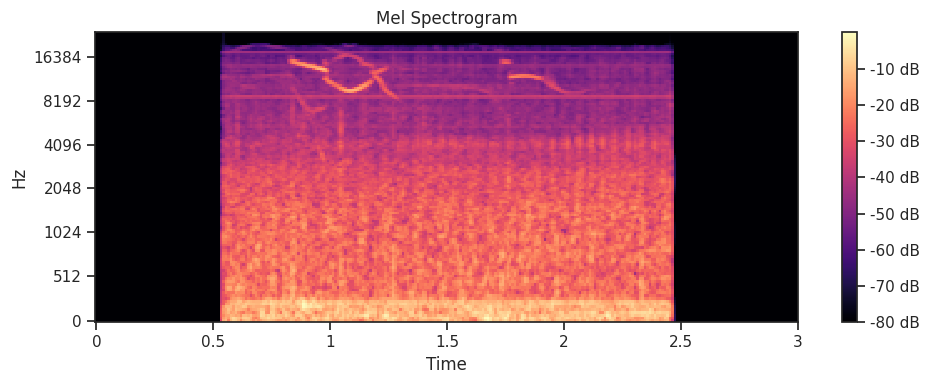

In [234]:
# Function to preprocess audio
def preprocess_audio(file_path, target_sr=48000, duration=3):
    # Load audio
    signal, sr = librosa.load(file_path, sr=target_sr, mono=True)
    
    # Calculate the maximum length in samples
    max_length = target_sr * duration  # e.g., 48000 * 3
    
    # If the signal is shorter than the desired length, pad with silence
    if len(signal) < max_length:
        padding = max_length - len(signal)
        pad_left = padding // 2
        pad_right = padding - pad_left
        signal = np.pad(signal, (pad_left, pad_right), mode='constant')
        return [signal]
    
    # If the signal is longer than the desired length, split into 3-second windows
    elif len(signal) > max_length:
        # first cut the signal so it will split in multiples of 3
        signal = signal[:-(len(signal) % max_length)]
        segments = []
        for start in range(0, len(signal), max_length):
            end = start + max_length
            segment = signal[start:end]
            if len(segment) < max_length:
                segment = np.pad(segment, (0, max_length - len(segment)), mode='constant')
            if len(segment) >= target_sr:  # Ensure segment is at least 1 second long
                if len(segment) < max_length:
                    padding = max_length - len(segment)
                    pad_left = padding // 2
                    pad_right = padding - pad_left
                    segment = np.pad(segment, (pad_left, pad_right), mode='constant')
                segments.append(segment)
        return segments
    
    # If the signal is exactly the desired length, return as is
    else:
        return [signal]
    
# Function to preprocess audio
def preprocess_audio_test(file_path, target_sr=48000, duration=3):
    # Load audio
    signal, sr = librosa.load(file_path, sr=target_sr, mono=True)
    
    # Calculate the maximum length in samples
    max_length = target_sr * duration  # e.g., 48000 * 3
    
    # If the signal is shorter than the desired length, pad with silence
    if len(signal) < max_length:
        padding = max_length - len(signal)
        pad_left = padding // 2
        pad_right = padding - pad_left
        signal = np.pad(signal, (pad_left, pad_right), mode='constant')
        return signal
    
    # If the signal is longer than the desired length, take random 3 second window
    elif len(signal) > max_length:
        start = np.random.randint(0, len(signal) - max_length)
        end = start + max_length
        signal = signal[start:end]
        return signal
    
    # If the signal is exactly the desired length, return as is
    else:
        return signal

# Test preprocess on a single file
sample_file = os.path.join(df_train["File"][0])
processed_audios = preprocess_audio(sample_file, target_sr=48000, duration=3)

# Visualize waveforms

# print class
print(f"Class: {df_train['Class'][0]}")

processed_audio = processed_audios[0]
plt.figure(figsize=(10, 4))
librosa.display.waveshow(processed_audio, sr=48000)
plt.title(f"Processed Audio Waveform")
plt.show()

# Mel spectrogram
mel_spectrogram = librosa.feature.melspectrogram(y=processed_audio, sr=48000)
mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)

# Visualize mel spectrogram
plt.figure(figsize=(10, 4))
librosa.display.specshow(mel_spectrogram, sr=48000, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title(f"Mel Spectrogram")
plt.tight_layout()
plt.show()

# Listen audio
import IPython.display as ipd
ipd.Audio(processed_audio, rate=48000)

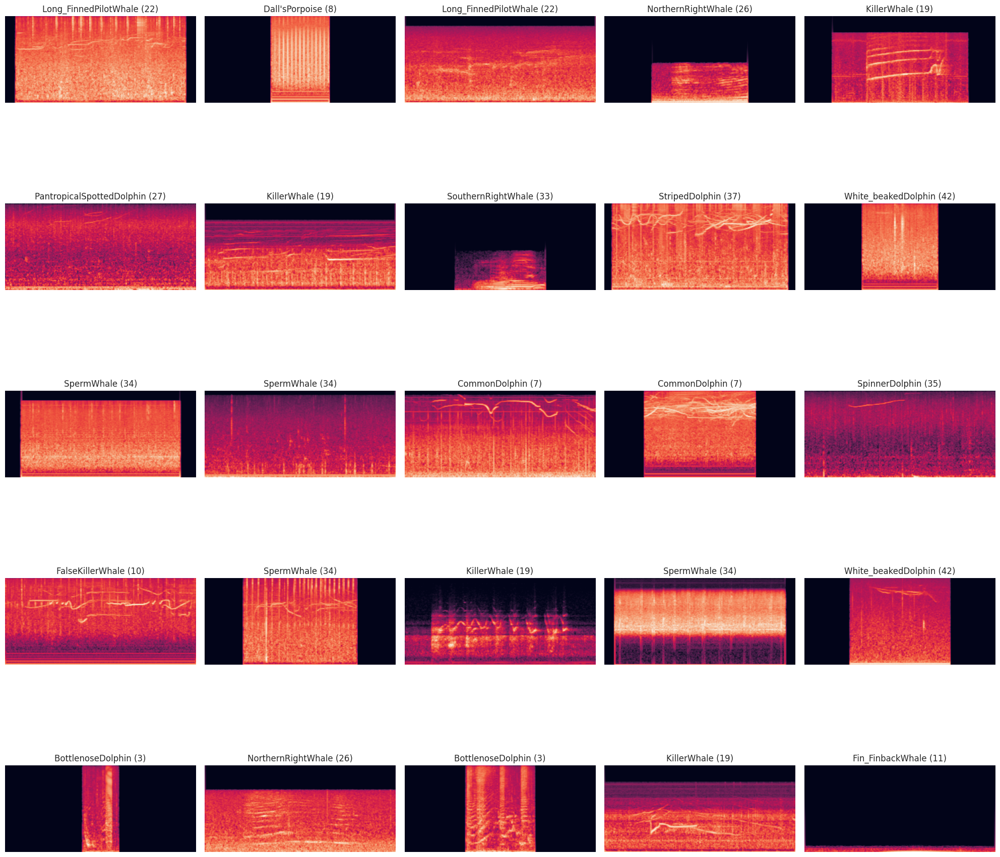

In [235]:
# take 25 random samples of different classes and plot in a grid with its class
# Select 25 random samples
random_samples = df_train.sample(25, random_state=42)

# Create a grid of plots
fig, axes = plt.subplots(5, 5, figsize=(20, 20))

# Flatten the axes
axes = axes.ravel()

# Loop through all the samples

for i, (_, row) in enumerate(random_samples.iterrows()):
    # Load the audio file
    signal, sr = librosa.load(row['File'], sr=48000)

    # preprocess the audio
    processed_audios = preprocess_audio(row['File'], target_sr=48000, duration=3)
    
    # Calculate the mel spectrogram
    mel_spectrogram = librosa.feature.melspectrogram(y=processed_audios[0], sr=48000)
    mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)
    
    # Plot the mel spectrogram
    axes[i].imshow(mel_spectrogram, origin='lower')
    axes[i].set_title(f"{row['Class']} ({classes_mapping[row['Class']]})")
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# Data Generators

## Data Augmentation

In [236]:
from pydub import AudioSegment

def add_noise(signal, noise_factor=0.005):
    noise = np.random.randn(len(signal))
    augmented_signal = signal + noise_factor * noise
    return augmented_signal

def shift_time(signal, shift_max=0.4):
    shift = np.random.randint(int(shift_max * len(signal)))
    augmented_signal = np.roll(signal, shift)
    return augmented_signal

# Mix Up
def mix_up(signal1, signal2, alpha=0.5):
    mixed_signal = alpha * signal1 + (1 - alpha) * signal2
    return mixed_signal

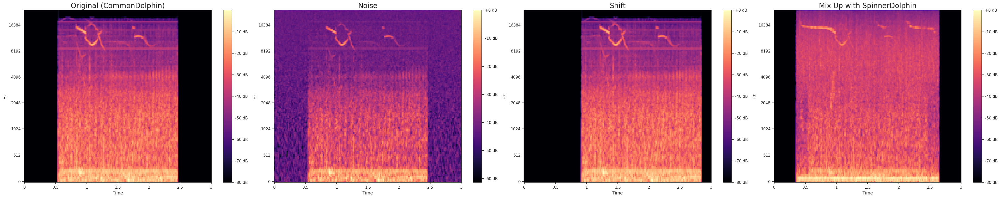

In [237]:
# Check data augmentation in the same audio, plot the original and the augmented audio with each of the changes
# Load the audio file
sample_file = df_train['File'][0]
sample_file_1 = df_train['File'][1]
signal, sr = librosa.load(sample_file, sr=48000)
signal_1, sr_1 = librosa.load(sample_file_1, sr=48000)

# preprocess the audio
signal = preprocess_audio(sample_file, target_sr=48000, duration=3)[0]
signal_1 = preprocess_audio(sample_file_1, target_sr=48000, duration=3)[0]

# Add noise
augmented_signal_noise = add_noise(signal, noise_factor=0.005)

# Shift time
augmented_signal_shift = shift_time(signal, shift_max=0.2)

# Mix up
augmented_signal_mix_up = mix_up(signal, signal_1, alpha=0.5)

# Mel spectrograms
mel_spectrogram = librosa.feature.melspectrogram(y=signal, sr=48000)
mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)

mel_spectrogram_noise = librosa.feature.melspectrogram(y=augmented_signal_noise, sr=48000)
mel_spectrogram_noise = librosa.power_to_db(mel_spectrogram_noise, ref=np.max)

mel_spectrogram_shift = librosa.feature.melspectrogram(y=augmented_signal_shift, sr=48000)
mel_spectrogram_shift = librosa.power_to_db(mel_spectrogram_shift, ref=np.max)

mel_spectrogram_mix_up = librosa.feature.melspectrogram(y=augmented_signal_mix_up, sr=48000)
mel_spectrogram_mix_up = librosa.power_to_db(mel_spectrogram_mix_up, ref=np.max)

# Visualize mel spectrogram
plt.figure(figsize=(40, 8))
plt.subplot(1, 4, 1)
librosa.display.specshow(mel_spectrogram, sr=48000, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title(f'Original ({df_train["Class"][0]})', fontsize=20)
plt.tight_layout()

plt.subplot(1, 4, 2)
librosa.display.specshow(mel_spectrogram_noise, sr=48000, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Noise', fontsize=20)
plt.tight_layout()

plt.subplot(1, 4, 3)
librosa.display.specshow(mel_spectrogram_shift, sr=48000, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Shift', fontsize=20)
plt.tight_layout()

plt.subplot(1, 4, 4)
librosa.display.specshow(mel_spectrogram_mix_up, sr=48000, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title(f'Mix Up with {df_train["Class"][1]}', fontsize=20)
plt.tight_layout()

In [238]:
def audio_data_generator(df, batch_size=32, target_sr=48000, duration=3, augment=False):
    while True:
        X, y = [], []
        for _, row in df.iterrows():
            file_path = row['File']
            cls_index = classes_mapping[row['Class']] # Ensure it is the same classes mapping
            signals = preprocess_audio(file_path, target_sr, duration)
            for signal in signals:
                if augment:
                    if np.random.rand() < 0.5:
                        signal = add_noise(signal)
                    if np.random.rand() < 0.5:
                        signal = shift_time(signal)
                    if np.random.rand() < 0.5:
                        #TODO: Add Background noise for mixup
                        signal_1 = preprocess_audio(df_train['File'][np.random.randint(0, len(df_train))], target_sr=48000, duration=3)[0]
                        signal = mix_up(signal, signal_1, alpha=0.5)
                
                X.append(signal)
                y.append(cls_index)
                
                if len(X) == batch_size:
                    X = np.array(X)
                    y = np.array(y)
                    yield X, to_categorical(y, num_classes=len(classes))
                    X, y = [], []

def audio_data_generator_test(df, batch_size=1, target_sr=48000, duration=3):
    while True:
        X, y = [], []
        for _, row in df.iterrows():
            file_path = row['File']
            cls_index = classes_mapping[row['Class']] # Ensure it is the same classes mapping
            signal = preprocess_audio_test(file_path, target_sr, duration)
            X.append(signal)
            y.append(cls_index)
                
            if len(X) == batch_size:
                X = np.array(X)
                y = np.array(y)
                yield X, to_categorical(y, num_classes=len(classes))
                X, y = [], []

# Test the generator with test_Df
test_df = df_test
classes = list(test_df['Class'].unique())
test_gen = audio_data_generator(test_df, batch_size=32, target_sr=48000, duration=3)
X, y = next(test_gen)
print(X.shape, y.shape)

(32, 144000) (32, 44)


IndexError: list index out of range

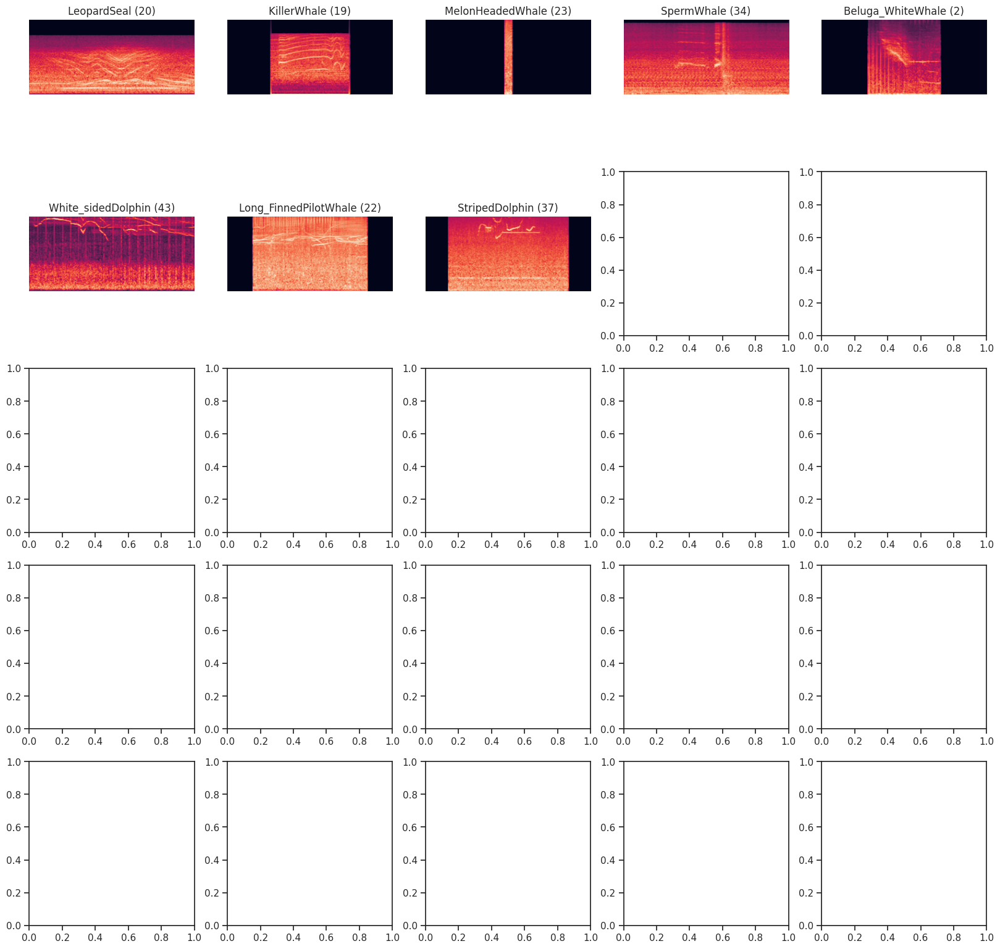

In [239]:
# take 25 random samples of different classes and plot in a grid with its class
# Select 25 random samples
random_samples = test_df.sample(25, random_state=42)

# Create a grid of plots
fig, axes = plt.subplots(5, 5, figsize=(20, 20))

# Flatten the axes
axes = axes.ravel()

# Loop through all the samples

for i, (_, row) in enumerate(random_samples.iterrows()):
    # Load the audio file
    signal, sr = librosa.load(row['File'], sr=48000)

    # preprocess the audio
    processed_audios = preprocess_audio(row['File'], target_sr=48000, duration=3)
    
    # Calculate the mel spectrogram
    mel_spectrogram = librosa.feature.melspectrogram(y=processed_audios[0], sr=48000)
    mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)
    
    # Plot the mel spectrogram
    axes[i].imshow(mel_spectrogram, origin='lower')
    axes[i].set_title(f"{row['Class']} ({classes_mapping[row['Class']]})")
    axes[i].axis('off')

plt.tight_layout()
plt.title('Test Data with Data Augmentation')
plt.show()

# Base Model

In [ ]:
# Dont show warnings
import warnings
warnings.filterwarnings('ignore')
# Load the model
model_path = 'BirdNET-Analyzer-V2.4/V2.4/BirdNET_GLOBAL_6K_V2.4_Model/'
model = tf.keras.models.load_model(model_path, compile=False).model

In [ ]:
# Get the output of the second to last layer
output_layer = model.layers[-2].output

# Add 3 dense layers: 512, 128 and len(classes)

# Add a dense layer with 512 units and ReLU activation
x = tf.keras.layers.Dense(512, activation='relu')(output_layer)

# Add a dense layer with 128 units and ReLU activation
x = tf.keras.layers.Dense(128, activation='relu')(x)

# Add a dense layer with the number of classes and softmax activation
output_layer = tf.keras.layers.Dense(len(classes), activation='softmax')(x)

# output_layer = tf.keras.layers.Dense(len(classes), activation='softmax')(model.output)

# Create a new model
model = tf.keras.models.Model(inputs=model.input, outputs=output_layer)

# Compile
# model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy', 'AUC', 'Precision', 'Recall', 'Sensitivity', 'TruePositives', 'TrueNegatives', 'FalsePositives', 'FalseNegatives', 'CategoricalAccuracy', 'F1Score'])

print(model.summary())

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 INPUT (InputLayer)          [(None, 144000)]             0         []                            
                                                                                                  
 MEL_SPEC1 (MelSpecLayerSim  (None, 96, 511, 1)           1         ['INPUT[0][0]']               
 ple)                                                                                             
                                                                                                  
 MEL_SPEC2 (MelSpecLayerSim  (None, 96, 511, 1)           1         ['INPUT[0][0]']               
 ple)                                                                                             
                                                                                            

In [ ]:
# Freeze first layers
for layer in model.layers[:-4]:
    layer.trainable = False

# Experiment 0: Base Model with Full Best of Watkins Dataset

In [ ]:
from private_credentials import API_COMETML
experiment = start(
  api_key=API_COMETML,
  project_name="Cetaceans",
  workspace="gruncrow",
)

In [58]:
EXPERIMENT = "0_testing"

OPTIMIZER = "adam"
LOSS = "categorical_crossentropy"
METRICS = ['accuracy'] # , 'AUC', 'Precision', 'Recall', 'Sensitivity', 'TruePositives', 'TrueNegatives', 'FalsePositives', 'FalseNegatives', 'CategoricalAccuracy', 'F1Score'

BATCH_SIZE = 8
EPOCHS = 100
SHUFFLE = True

# Callbacks
CALLBACKS = [
    ModelCheckpoint(f"Models/{EXPERIMENT}/best_model.h5", save_best_only=True, monitor="val_accuracy", mode="max", verbose=1),
    EarlyStopping(patience=10, restore_best_weights=True, monitor="val_accuracy", mode="max", verbose=1),
    CSVLogger(f"Models/{EXPERIMENT}/training_log.csv", append=True),
    LearningRateScheduler(lambda epoch: 1e-4 * 10**(epoch / 20)),
    ReduceLROnPlateau(factor=0.1, patience=5, verbose=1)
]

In [59]:
# Compile
model.compile(
    optimizer=OPTIMIZER, 
    loss=LOSS, 
    metrics=METRICS
    ) 

# model.summary()

# Train Model

In [60]:
# Training and Validation Generators

# shuffle data
df_train = shuffle(df_train, random_state=42)
df_val = shuffle(df_val, random_state=42)

train_gen = audio_data_generator(df_train, batch_size=BATCH_SIZE, target_sr=48000, duration=3)
val_gen = audio_data_generator(df_val, batch_size=BATCH_SIZE, target_sr=48000, duration=3)

# Calculate steps per epoch and validation steps
steps_per_epoch = len(df_train) // BATCH_SIZE
validation_steps = len(df_val) // BATCH_SIZE

# Train the model
history = model.fit(
    train_gen,
    validation_data=val_gen,
    shuffle=SHUFFLE,
    steps_per_epoch=steps_per_epoch,
    validation_steps=validation_steps,
    epochs=EPOCHS,
    callbacks=CALLBACKS,
    verbose=1
)

COMET INFO: Ignoring automatic log_parameter('verbose') because 'keras:verbose' is in COMET_LOGGING_PARAMETERS_IGNORE


Epoch 1/100
1553/1553 [==============================] - ETA: 0s - loss: 1.4890 - accuracy: 0.6391
Epoch 1: val_accuracy improved from -inf to 0.65142, saving model to Models/0_testing/best_model.h5
1553/1553 [==============================] - 328s 204ms/step - loss: 1.4890 - accuracy: 0.6391 - val_loss: 2.0661 - val_accuracy: 0.6514 - lr: 1.0000e-04
Epoch 2/100
1553/1553 [==============================] - ETA: 0s - loss: 1.1273 - accuracy: 0.7273
Epoch 2: val_accuracy did not improve from 0.65142
1553/1553 [==============================] - 313s 201ms/step - loss: 1.1273 - accuracy: 0.7273 - val_loss: 1.0012 - val_accuracy: 0.5638 - lr: 1.1220e-04
Epoch 3/100
1553/1553 [==============================] - ETA: 0s - loss: 0.8143 - accuracy: 0.7756
Epoch 3: val_accuracy improved from 0.65142 to 0.86276, saving model to Models/0_testing/best_model.h5
1553/1553 [==============================] - 309s 199ms/step - loss: 0.8143 - accuracy: 0.7756 - val_loss: 0.5728 - val_accuracy: 0.8628 - lr

# Monitor Training

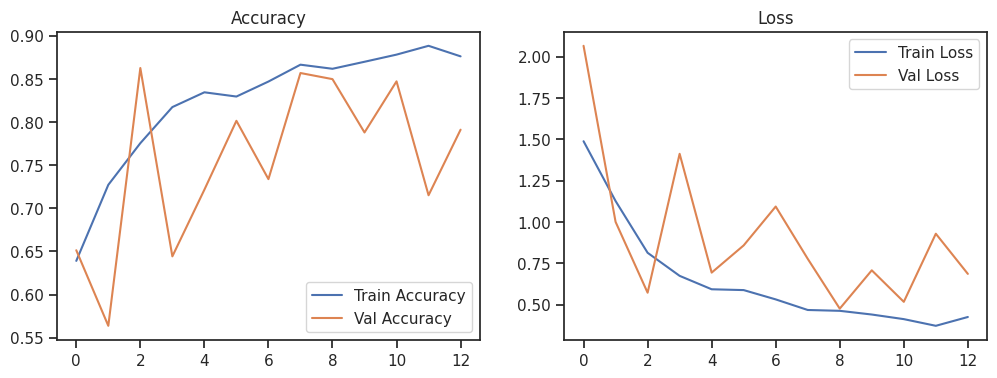

In [61]:
# Plot accuracy and loss
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.legend()
plt.title("Accuracy")

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.legend()
plt.title("Loss")

plt.show()

# Evaluate Model

In [152]:
# Evaluate on test data
test_gen = audio_data_generator(df_test, batch_size=1)

# # Itera sobre el generador para recolectar todas las etiquetas
# y_true = []
# for _, y_batch in test_gen:
#     y_true.extend(np.argmax(y_batch, axis=1))  # Convierte one-hot a índices
#     if len(y_true) >= len(df_test):  # Solo recolecta hasta completar el dataset
#         break

# y_true = np.array(y_true)

test_steps = len(df_test) // 1

results = model.evaluate(test_gen, steps=test_steps)
print(f"Test Loss: {results[0]}, Test Accuracy: {results[1]}")

1554/1554 [==============================] - 46s 30ms/step - loss: 0.7221 - accuracy: 0.8005
Test Loss: 0.7220785021781921, Test Accuracy: 0.800514817237854


In [153]:
# Sample same samples from test set and predict
TEST_BATCH_SIZE = len(df_test)
TEST_STEPS = len(df_test) // TEST_BATCH_SIZE
X_eval, y_true = next(audio_data_generator(df_test, batch_size=TEST_BATCH_SIZE, target_sr=48000, duration=3))

y_predicted = model.predict(X_eval)

49/49 [==============================] - 29s 595ms/step


In [154]:
# Get the predicted classes and confidence
y_pred_classes = np.argmax(y_predicted, axis=1)
y_pred_confidence = np.max(y_predicted, axis=1)

y_pred = np.vstack((y_pred_classes, y_pred_confidence))
y_true = np.argmax(y_true, axis=1)

In [155]:
# Accuracy manual
accuracy_manual = np.mean(y_pred_classes == y_true)
print(f"Accuracy from model.evaluate: {results[1]}")
print(f"Manual accuracy: {accuracy_manual}")

Accuracy from model.evaluate: 0.800514817237854
Manual accuracy: 0.8005148005148005


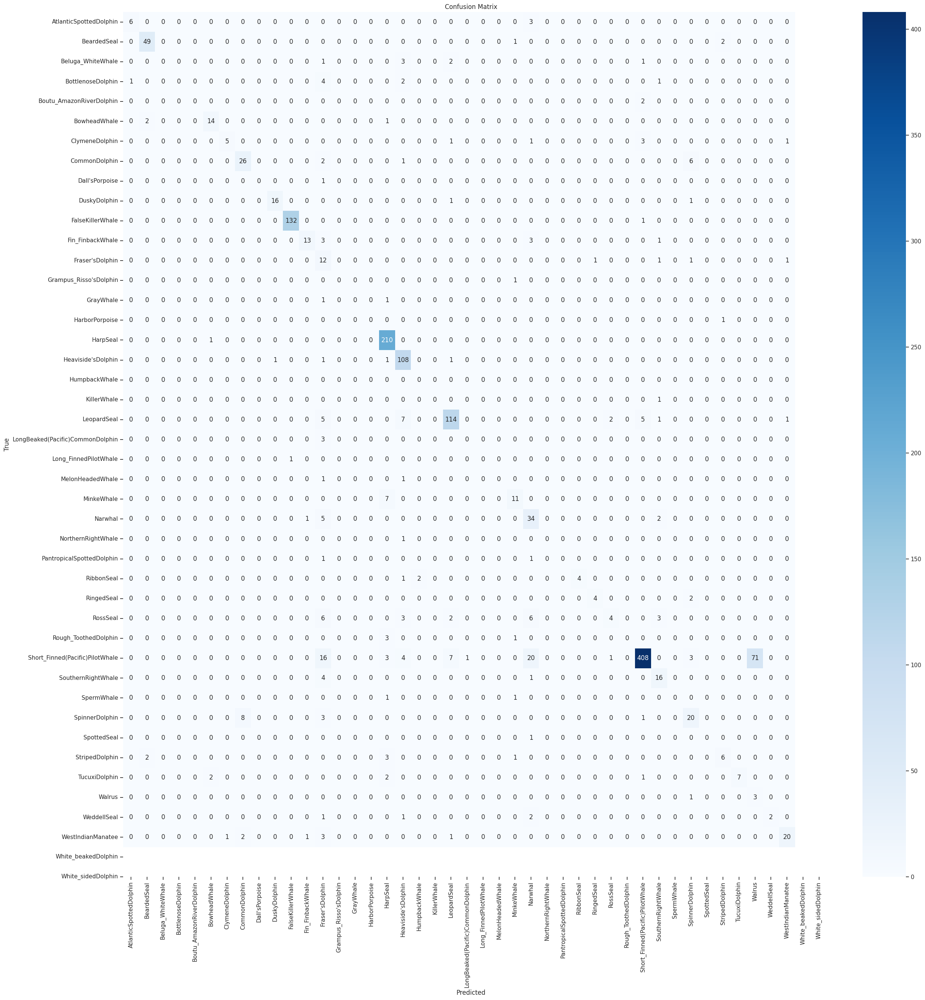

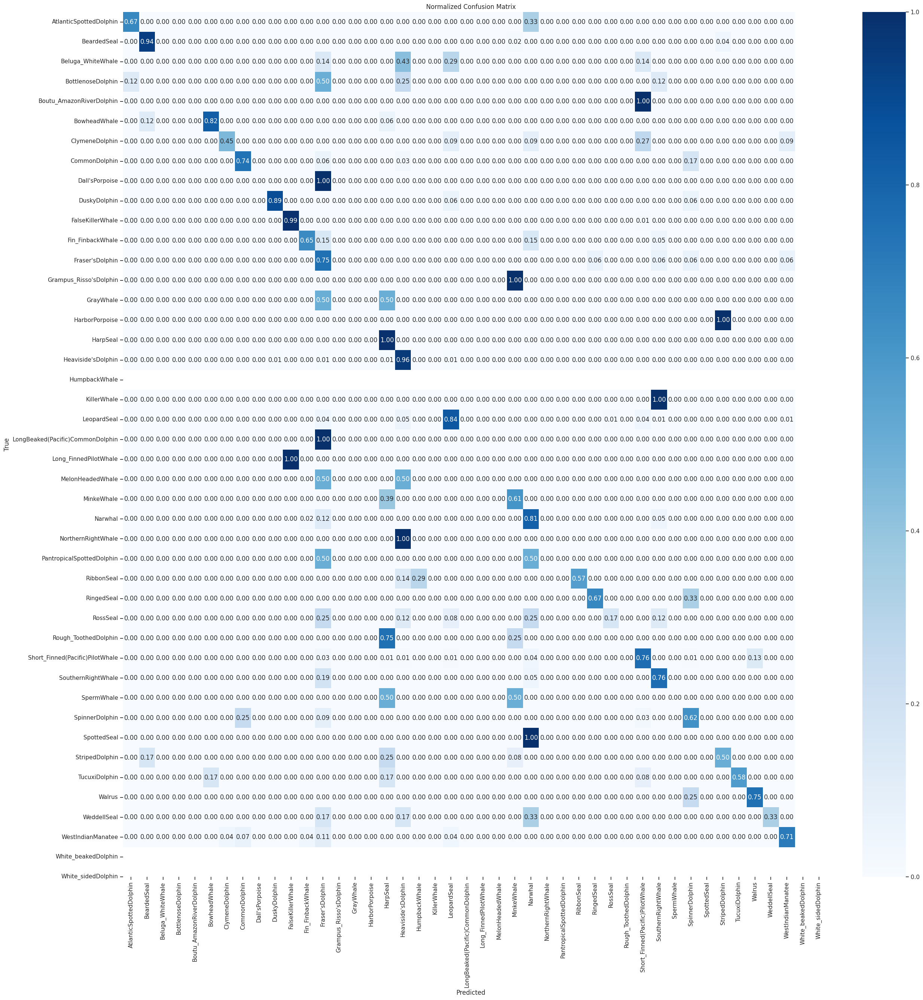

In [156]:
# Plot confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(30, 30))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Normalized by rows
cm_normalized = cm / cm.sum(axis=1)[:, np.newaxis]
plt.figure(figsize=(30, 30))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.title('Normalized Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [157]:
# Put together X_eval, y_true, y_pred_classes, y_pred_confidence
df_results = pd.DataFrame({
	'Signal': list(X_eval),
	'True': y_true,
	'Predicted': y_pred_classes,
    'PredictedClass': [reverse_classes_mapping[p] for p in y_pred_classes],
	'Confidence': y_pred_confidence
})

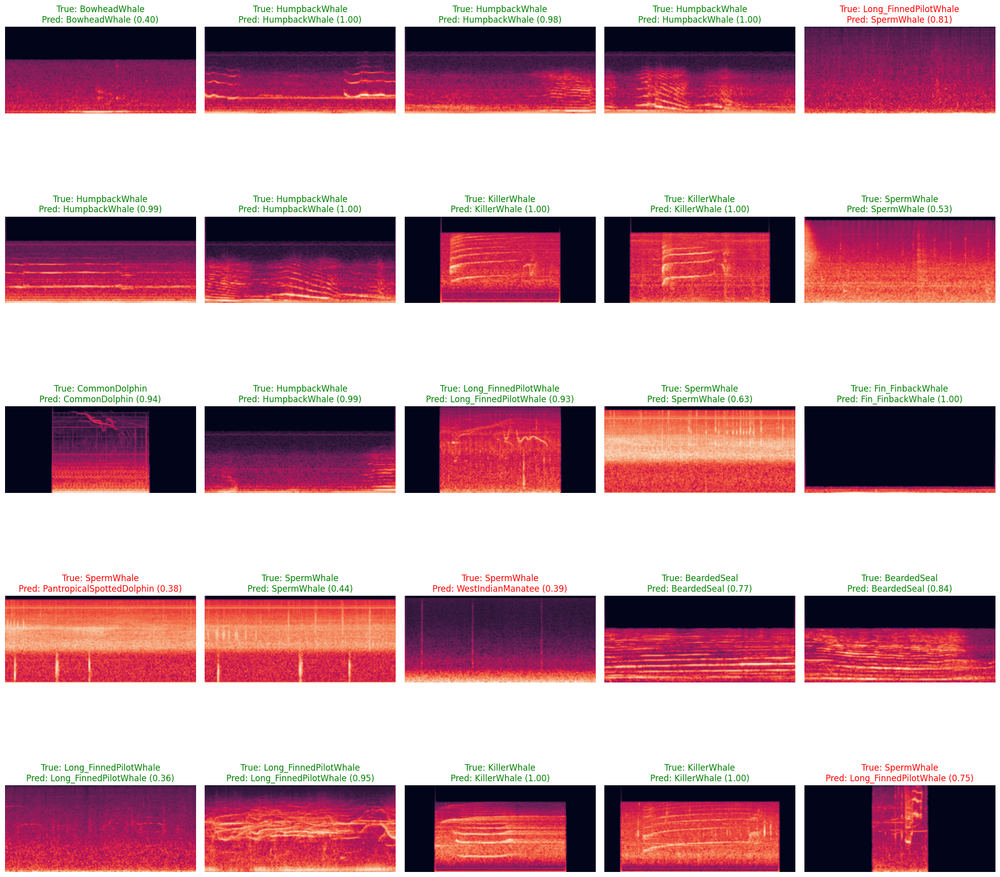

In [158]:
# Plot 25 random samples
# Create a grid of plots
plot_results(df_results, mode='random')

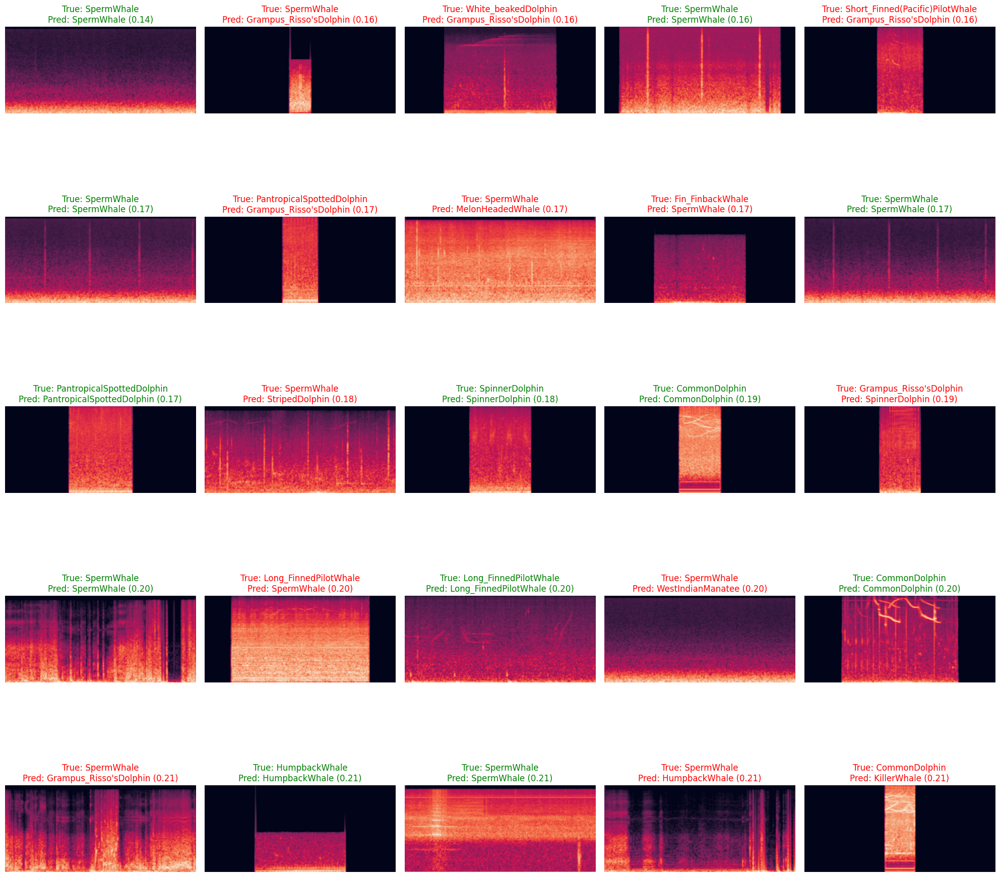

In [159]:
# Select 25 samples with lowest confidence
plot_results(df_results, mode='min')

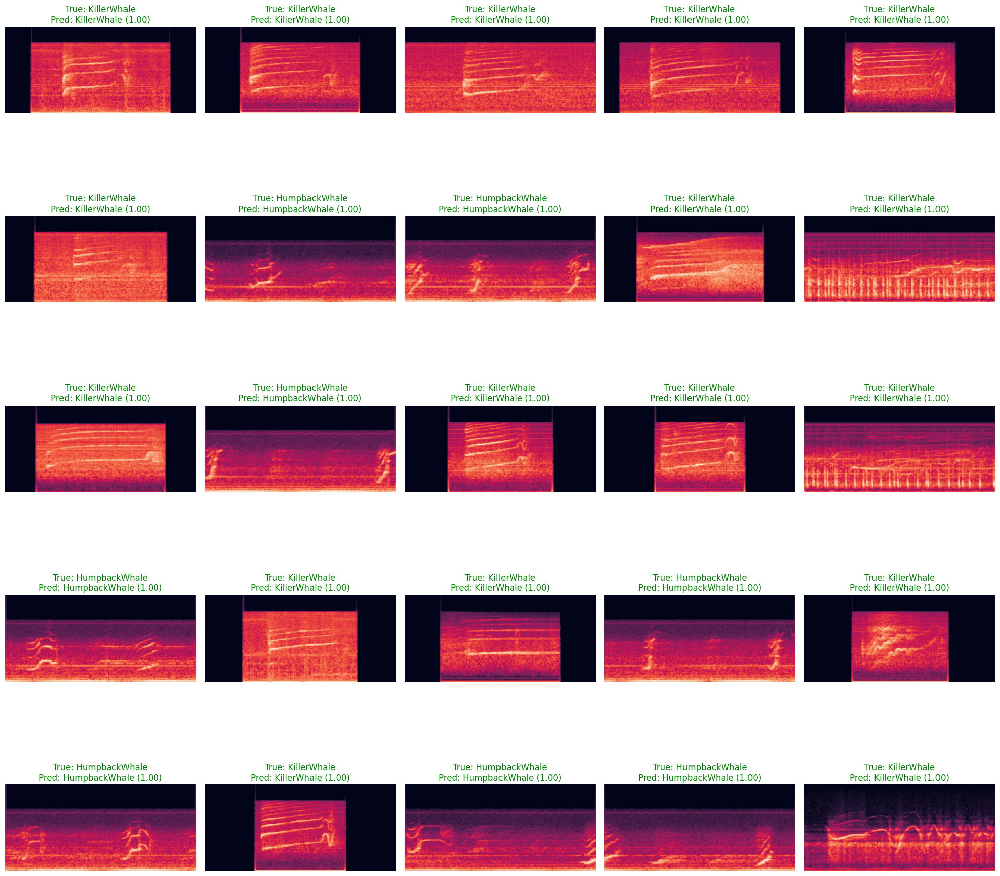

In [161]:
# Select 25 samples with highest confidence
plot_results(df_results, mode='max')

In [73]:
experiment.end()

COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO: Comet.ml Experiment Summary
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO:   Data:
COMET INFO:     display_summary_level : 1
COMET INFO:     name                  : moral_flow_4087
COMET INFO:     url                   : https://www.comet.com/gruncrow/cetaceans/5fe6f952a7464dec8ea887fe129980a3
COMET INFO:   Metrics [count] (min, max):
COMET INFO:     accuracy [13]                 : (0.6390856504440308, 0.888522207736969)
COMET INFO:     batch_accuracy [2028]         : (0.0, 1.0)
COMET INFO:     batch_loss [2028]             : (0.00017723930068314075, 3.7942559719085693)
COMET INFO:     epoch_duration [13]           : (242.34033824900325, 317.9882388549995)
COMET INFO:     loss [13]                     : (0.3726693391799927, 1.4889506101608276)
COMET INFO:     lr [13]                       : (9.999999747378752e-0

There are a lot of classes that have been predicted as Sperm Whale which was the class with more samples. This is because the model is biased to predict the class with more samples. We will try to balance the classes and see if the model improves. Let's undersample all classes to 500 samples per class.

# Experiment 1: Undersampling

In [ ]:
# Calcular la distribución de clases
class_distribution = df['Class'].value_counts()

# Identificar las clases submuestreadas (por ejemplo, aquellas con menos del 50% del tamaño de la clase más grande)
threshold = class_distribution.max() * 0.3
undersampled_classes = class_distribution[class_distribution < threshold].index.tolist()

print(f"Clases submuestreadas: {undersampled_classes}")

In [ ]:
# TODO: Experiment: take 500 random samples per class
# # take maximum 500 random samples per class
# df = df.groupby('Class').apply(lambda x: x.sample(min(len(x), 500))).reset_index(drop=True)

# Replace underscores with spaces in class names for better readability
df['Class'] = df['Class'].str.replace('_', ' ')

# Create a new column to indicate if the species is important
df['Important'] = df['Class'].apply(lambda x: 'Important' if x in important_species else 'Not Important')

# Bar plot of dataset count with colors for important species
plt.figure(figsize=(10, 5))
sns.countplot(data=df, x='Class', hue='Important', palette={'Important': 'green', 'Not Important': 'gray'})
plt.title('Dataset count by class')
plt.xticks(rotation=90, ha='right', fontsize=10)  # Adjust fontsize and alignment
plt.tight_layout()  # Adjust layout to make room for labels
plt.legend([],[], frameon=False)  # Remove legend
plt.show()